## Árvores de regressão - exercícios 02

Este exercício será uma continuação do anterior, mesma base, mesmas variáveis - vamos tentar buscar a 'melhor árvore'.


*Atenção - Utilizar a base de dados em anexo que é a mesma base que utilizamos na atividade anterior! A base Boston, assim como para a primeira atividade foi descontinuada e não deve ser utilizada*

In [1]:
import pandas as pd

import seaborn as sns

from sklearn import datasets
from sklearn.tree import DecisionTreeRegressor
from sklearn import tree
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error as mse

import matplotlib.pyplot as plt

### 1. Execute os passos do exercício anterior, até que você tenha uma árvore de regressão predizendo o valor do imóvel na base de treinamento.

In [2]:
# Considerando que o estudo da base de dados já foi realizada corretamente na Tarefa 1 do Módulo 11, 
# seguiremos com sua limpeza de forma direta

# Importando base de dados
casa = pd.read_csv('housing.csv')

# Limpar a coluna "total_bedrooms"
casa['total_bedrooms'] = casa['total_bedrooms'].interpolate()

In [3]:
# Classificando os dados de x e y e separando os dados de treino e teste

# Dados de X
X = pd.get_dummies(casa.drop(columns = ['median_house_value']), drop_first = True)

# Dados de y
y = casa.loc[:, 'median_house_value']

# Seprarando os dados de teste e treino
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=2360873)

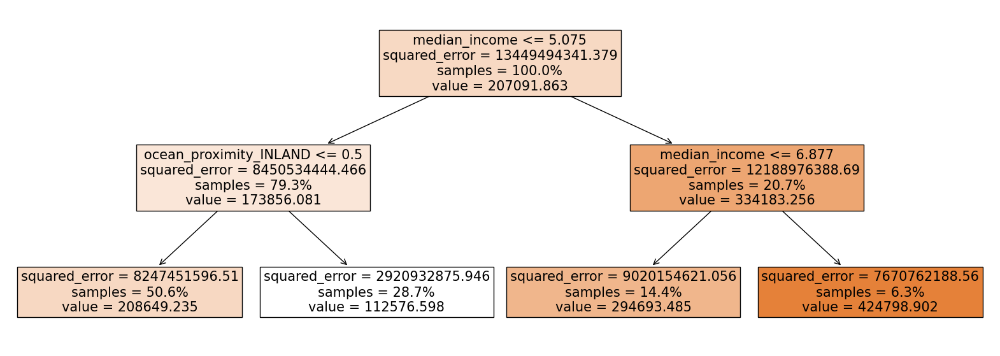

In [4]:
# Como explicado na tarefa 1 a árvore mais adequada, entre as analisadas, é a de profundidade 2 

# Treino da Árvore de Profundidade Máxima 2
tree_2 = DecisionTreeRegressor(max_depth=2)
tree_2.fit(X_train, y_train)

# Vizualização da árvore de profundidade máxima 2
plt.figure(figsize=(20, 7))
arvore = tree.plot_tree(tree_2, max_depth = 40, feature_names = X.columns, filled = True, 
                        proportion = True, fontsize = 15) 

### 2.  Calcule o caminho indicado pelos CCP-alfas dessa árvore.

In [5]:
# Fazendo Pós-poda com CCP
path = tree_2.cost_complexity_pruning_path(X_train, y_train)
path

{'ccp_alphas': array([0.00000000e+00, 7.41799566e+08, 1.69012137e+09, 4.22398185e+09]),
 'impurities': array([6.79359156e+09, 7.53539112e+09, 9.22551249e+09, 1.34494943e+10])}

Text(0, 0.5, 'Impureza total das folhas')

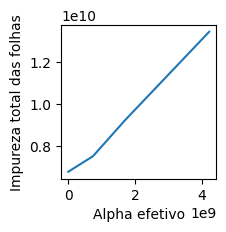

In [6]:
# Observando o comportamento da impureza
ccp_alphas, impurities = path.ccp_alphas, path.impurities

plt.figure(figsize=(2, 2))
plt.plot(ccp_alphas, impurities)
plt.xlabel("Alpha efetivo")
plt.ylabel("Impureza total das folhas")

### 3. Paca cada valor de alpha obtido no item 2, treine uma árvore com o respectivo alfa, e guarde essa árvore em uma lista.

In [7]:
# Criando a lista para guardar os resultados dos modelos
clfs = []

#Treinando as árvores para cada valor de ccp_alpha
for ccp in ccp_alphas:
    clf = DecisionTreeRegressor(random_state=0, ccp_alpha = ccp)
    clf.fit(X_train, y_train)
    clfs.append(clf)

Text(0, 0.5, 'Profundidade da árvore')

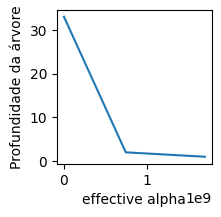

In [8]:
# Observando o comportamento desses resultados 
tree_depths = [clf.tree_.max_depth for clf in clfs]
plt.figure(figsize=(2, 2))
plt.plot(ccp_alphas[:-1], tree_depths[:-1])
plt.xlabel("effective alpha")
plt.ylabel("Profundidade da árvore")

### 4. Para cada árvore na lista, calcule o MSE da árvore.

In [9]:
# Comparativo dos erros em relação à profundidade das árvores (ccp_alpha)
train_scores = [mse(y_train, clf.predict(X_train)) for clf in clfs]
test_scores  = [mse(y_test, clf.predict(X_test)) for clf in clfs]

### 5. Monte um gráfico do MSE pelo alpha, escolha um valor de alpha perto do ponto de mínimo do MSE

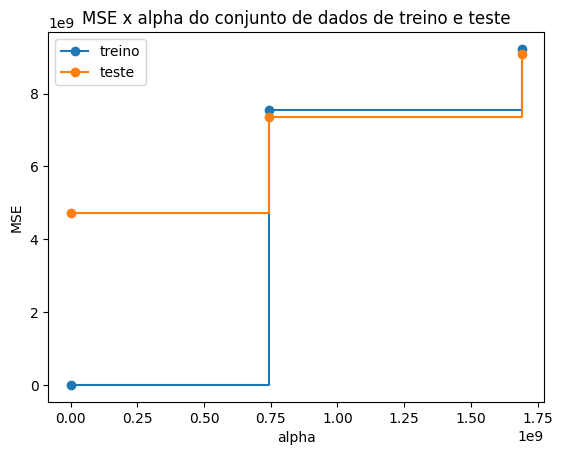

In [10]:
# Observando graficamente o comprativo
fig, ax = plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("MSE")
ax.set_title("MSE x alpha do conjunto de dados de treino e teste")
ax.plot(ccp_alphas[:-1], train_scores[:-1], marker='o', label="treino",
        drawstyle="steps-post")
ax.plot(ccp_alphas[:-1], test_scores[:-1], marker='o', label="teste",
        drawstyle="steps-post")
ax.legend()
plt.show()

O valor de MSE de ponto de mínimo, de teste, parateste é, aproximadamente, 5 e o valor de alpha varia entre 0 e 0,75


### 6. Calcule o R-quadrado dessa árvore encontrada no item acima

In [11]:
# Considerando o valor de alpha 50%, encontrado no item acima
rquad_min = DecisionTreeRegressor(random_state = 0, ccp_alpha = .5)
rquad_min.fit(X_train, y_train)

DecisionTreeRegressor(ccp_alpha=0.5, random_state=0)

In [12]:
print(f"Profundidade: {rquad_min.tree_.max_depth}")
print(f"R-quadrado de treino: {rquad_min.score(X_train, y_train):.4f}")
print(f"MSE de treino: {mse(y_train, rquad_min.predict(X_train)):.4f}")
print(f"R-quadrado de teste: {rquad_min.score(X_test, y_test):.4f}")
print(f"MSE de teste: {mse(y_test, rquad_min.predict(X_test)):.4f}")

Profundidade: 33
R-quadrado de treino: 1.0000
MSE de treino: 37.4683
R-quadrado de teste: 0.6354
MSE de teste: 4707600287.9325


### 7. Visualize esta árvore.

In [15]:
# Vizualização da árvore de profundidade máxima 33
plt.figure(figsize=(100, 100))
arvore = tree.plot_tree(rquad_min, feature_names = X.columns, filled = True, 
                        proportion = True, fontsize = 5)